In [16]:
from IPython.core.display import HTML,Image
HTML('''<script> code_show=true;  function code_toggle() {  if (code_show){  $('div.input').hide();  } else {  $('div.input').show();  }  code_show = !code_show }  $( document ).ready(code_toggle); </script> <form action='javascript:code_toggle()'><input type='submit' value='Toggle Code'></form>''')

In [23]:
import warnings
warnings.filterwarnings('ignore')
import gc, argparse, sys, os, errno
%pylab inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt;
import seaborn as sns
#sns.set()
#sns.set_style('whitegrid')
import h5py
from PIL import Image
import os
from tqdm import tqdm_notebook as tqdm
import scipy
import sklearn
from scipy.stats import pearsonr
from scipy.io import loadmat
import IPython.display as ipd
import IPython
import librosa.display
import librosa
from pystoi import stoi

Populating the interactive namespace from numpy and matplotlib


In [97]:
def plot_stft(audio,ax=None,n_fft=256,hop_length=128,show=False,n_mels=128,y_axis='mel'):
    X = librosa.stft(audio,n_fft=n_fft,hop_length=hop_length)
    if y_axis=='mel':
        #x_stft_db = librosa.feature.melspectrogram(x, sr=16000,n_fft=n_fft,win_length=win_length,hop_length=hop_length)
        S = librosa.feature.melspectrogram(audio, sr=16000,n_mels=n_mels,fmax=8000,n_fft=n_fft,hop_length=hop_length)
        #print (S.shape)
        if show:
            librosa.display.specshow(librosa.power_to_db(S,
                                              ref=np.max),
                             y_axis='mel',cmap='gray_r',ax=ax, fmax=8000)
        else:
            return librosa.power_to_db(S,ref=np.max)
    else:
        if show:
            specshow(librosa.amplitude_to_db(abs(X)),cmap=cm.Blues,#cm.gray_r,
                                      sr=16000,ax=ax)
        else:
            return librosa.amplitude_to_db(abs(X))
    
def MSE_pcc(A,B,ax=None):
    mse =np.mean(((A - B)**2/B.var()))
    pcc = pearsonr(A.ravel(),B.ravel())[0]
    return mse,pcc
def analyze(predict,GT_STFT_test_spkr,audio_pred,audio_gt,mode='test'):
    samples = predict.shape[0]
    pcc = np.zeros([samples])
    mse = np.zeros([samples])
    for i in range(samples):
        mse[i], pcc[i] = MSE_pcc(predict[i],GT_STFT_test_spkr[i])
        #mse[i], pcc[i] = MSE_pcc(predict[i] ,GT_STFT_test_spkr[i] )
    stois = []
    for i in range(samples):
        stois.append(stoi(audio_pred[i*interval:(i+1)*interval], audio_gt[i*interval:(i+1)*interval], 16000, extended=False))
    stois = np.array(stois)
    fig,ax=plt.subplots(1,3,figsize=(18,4))
    ax[0].hist(mse,bins=25,color='b')
    ax[0].set_title(mode+' MSE: %g(%g)' %(np.round(mse.mean(),3),np.round(mse.std(),3)))
    ax[1].hist(pcc,bins=50,color='g')
    ax[1].set_title(mode+' PCC: %g(%g)' %(np.round(pcc.mean(),3),np.round(pcc.std(),3)))
    ax[2].hist(stois,bins=50,color='r')
    ax[2].set_title(mode+' STOI: %g(%g)' %(np.round(stois.mean(),3),np.round(stois.std(),3)))
    return mse,pcc,stois
def play(audio,sr=16000):
    '''
    audio: tensor, eg: ex['audio']
    '''
    if len(audio.shape) >=2:
        audio = audio.ravel()
    display(ipd.Audio(audio,rate=sr))

# audio to audio result

In [147]:
interval = 16384
wave_gt = np.load('ny742_test_wave.npy').ravel()
wave_pred = librosa.load('sample_1.pngdenoisewave.wav',sr=16000)[0]
wave_merge = np.concatenate(([np.concatenate((wave_gt[i*interval:(i+1)*interval],wave_pred[i*interval:(i+1)*interval]))\
                 for i in range(50)]))
select_word = np.loadtxt('wordlist.txt',dtype='str')

## ground truth audio

In [32]:
display(ipd.Audio(wave_gt,rate=16000))

## audio to audio reconstruction

In [33]:
display(ipd.Audio(wave_pred,rate=16000))

## corresponding word list

<details><summary><span style="color:red"><b>CLICK HERE to show/hide WORD LIST</b></span></summary>
<p>

<p>  1  <span style="color:blue"> <em>hammer    </em> </span> start from 0s </p>
<p>  2  <span style="color:blue"> <em>vase      </em> </span> start from 1.024s </p>
<p>  3  <span style="color:blue"> <em>umbrella  </em> </span> start from 2.048s </p>
<p>  4  <span style="color:blue"> <em>gun       </em> </span> start from 3.072s </p>
<p>  5  <span style="color:blue"> <em>key       </em> </span> start from 4.096s </p>
<p>  6  <span style="color:blue"> <em>cow       </em> </span> start from 5.12s </p>
<p>  7  <span style="color:blue"> <em>couch     </em> </span> start from 6.144s </p>
<p>  8  <span style="color:blue"> <em>glasses   </em> </span> start from 7.168s </p>
<p>  9  <span style="color:blue"> <em>airplane  </em> </span> start from 8.192s </p>
<p> 10  <span style="color:blue"> <em>leg       </em> </span> start from 9.216s </p>
<p> 11  <span style="color:blue"> <em>bee       </em> </span> start from 10.24s </p>
<p> 12  <span style="color:blue"> <em>cow       </em> </span> start from 11.26s </p>
<p> 13  <span style="color:blue"> <em>table     </em> </span> start from 12.29s </p>
<p> 14  <span style="color:blue"> <em>airplane  </em> </span> start from 13.31s </p>
<p> 15  <span style="color:blue"> <em>fork      </em> </span> start from 14.34s </p>
<p> 16  <span style="color:blue"> <em>hammer    </em> </span> start from 15.36s </p>
<p> 17  <span style="color:blue"> <em>gun       </em> </span> start from 16.38s </p>
<p> 18  <span style="color:blue"> <em>kite      </em> </span> start from 17.41s </p>
<p> 19  <span style="color:blue"> <em>cat       </em> </span> start from 18.43s </p>
<p> 20  <span style="color:blue"> <em>umbrella  </em> </span> start from 19.46s </p>
<p> 21  <span style="color:blue"> <em>gloves    </em> </span> start from 20.48s </p>
<p> 22  <span style="color:blue"> <em>knife     </em> </span> start from 21.5s </p>
<p> 23  <span style="color:blue"> <em>house     </em> </span> start from 22.53s </p>
<p> 24  <span style="color:blue"> <em>arrow     </em> </span> start from 23.55s </p>
<p> 25  <span style="color:blue"> <em>sheep     </em> </span> start from 24.58s </p>
<p> 26  <span style="color:blue"> <em>pencil    </em> </span> start from 25.6s </p>
<p> 27  <span style="color:blue"> <em>watch     </em> </span> start from 26.62s </p>
<p> 28  <span style="color:blue"> <em>kite      </em> </span> start from 27.65s </p>
<p> 29  <span style="color:blue"> <em>violin    </em> </span> start from 28.67s </p>
<p> 30  <span style="color:blue"> <em>box       </em> </span> start from 29.7s </p>
<p> 31  <span style="color:blue"> <em>toe       </em> </span> start from 30.72s </p>
<p> 32  <span style="color:blue"> <em>window    </em> </span> start from 31.74s </p>
<p> 33  <span style="color:blue"> <em>mouse     </em> </span> start from 32.77s </p>
<p> 34  <span style="color:blue"> <em>ball      </em> </span> start from 33.79s </p>
<p> 35  <span style="color:blue"> <em>hat       </em> </span> start from 34.82s </p>
<p> 36  <span style="color:blue"> <em>pencil    </em> </span> start from 35.84s </p>
<p> 37  <span style="color:blue"> <em>gun       </em> </span> start from 36.86s </p>
<p> 38  <span style="color:blue"> <em>cake      </em> </span> start from 37.89s </p>
<p> 39  <span style="color:blue"> <em>knife     </em> </span> start from 38.91s </p>
<p> 40  <span style="color:blue"> <em>crown     </em> </span> start from 39.94s </p>
<p> 41  <span style="color:blue"> <em>window    </em> </span> start from 40.96s </p>
<p> 42  <span style="color:blue"> <em>fork      </em> </span> start from 41.98s </p>
<p> 43  <span style="color:blue"> <em>hat       </em> </span> start from 43.01s </p>
<p> 44  <span style="color:blue"> <em>well      </em> </span> start from 44.03s </p>
<p> 45  <span style="color:blue"> <em>envelope  </em> </span> start from 45.06s </p>
<p> 46  <span style="color:blue"> <em>bed       </em> </span> start from 46.08s </p>
<p> 47  <span style="color:blue"> <em>hammer    </em> </span> start from 47.1s </p>
<p> 48  <span style="color:blue"> <em>gun       </em> </span> start from 48.13s </p>
<p> 49  <span style="color:blue"> <em>ball      </em> </span> start from 49.15s </p>
<p> 50  <span style="color:blue"> <em>flag      </em> </span> start from 50.18s </p>

</p>
</details>

## merged audio

In [71]:
display(ipd.Audio(wave_merge,rate=16000))

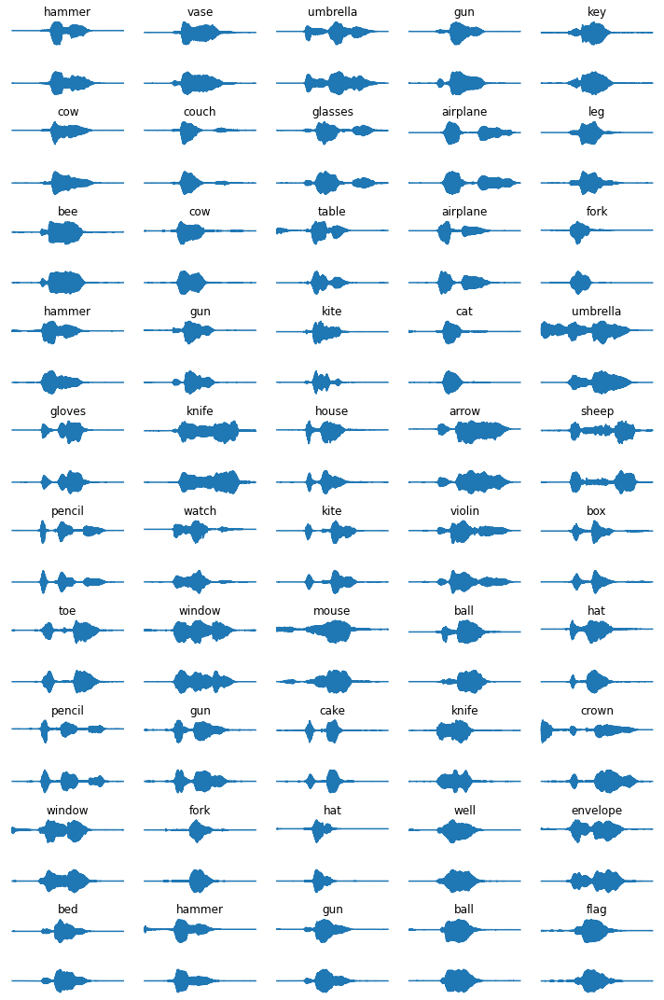

In [82]:
row_nums = 10
col_nums = 5
fig,ax=plt.subplots(row_nums*2,col_nums,figsize=(col_nums*2,row_nums*1.5))
for i in range(row_nums):
    for j in range(col_nums):
        try:
            ax[i*2,j].set_title(select_word[i*col_nums+j])
        except:
            pass
        ax[i*2,j].plot(wave_gt[(i*col_nums+j)*interval:(i*col_nums+j+1)*interval])
        ax[i*2+1,j].plot(wave_pred[(i*col_nums+j)*interval:(i*col_nums+j+1)*interval])
        ax[i*2,j].axis('off')
        ax[i*2+1,j].axis('off')
fig.tight_layout()

## spectrogram

In [123]:
spec_pred = np.zeros([50,256,128])
spec_gt = np.zeros([50,256,128])


for i in tqdm(range(50)):
    spec_pred[i] = plot_stft(wave_pred[i*interval:(i+1)*interval],n_fft=511,hop_length=129,ax=None ,y_axis='linear',n_mels=64)
    spec_gt[i] = plot_stft(wave_gt[i*interval:(i+1)*interval],n_fft=511,hop_length=129,ax=None,y_axis='linear',n_mels=64 )

spec_concat = np.concatenate(( np.flip(spec_gt,axis=1), np.flip(spec_pred,axis=1)),axis=1)
              #np.concatenate((np.swapaxes(spec_gt,2,1), np.swapaxes(spec_pred,2,1)),\
              #               axis=1)

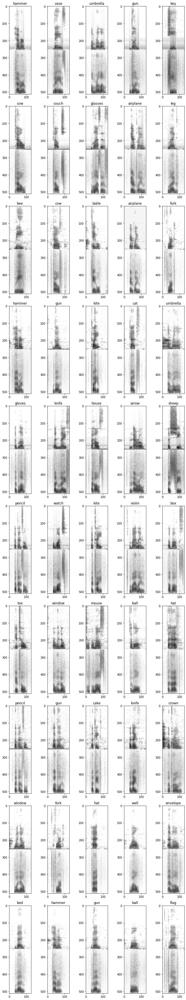

In [129]:
row_nums = 10
col_nums = 5
fig,ax=plt.subplots(row_nums,col_nums,figsize=(col_nums*2,row_nums*5))
cmap = cm.gray_r
for i in range(row_nums):
    for j in range(col_nums):
        ax[i,j].imshow(spec_concat[i*col_nums+j] ,cmap=cmap)
        try:
            ax[i,j].set_title(select_word[i*col_nums+j])
        except:
            pass
plt.tight_layout()

## metrics: MSE, PCC, STOI

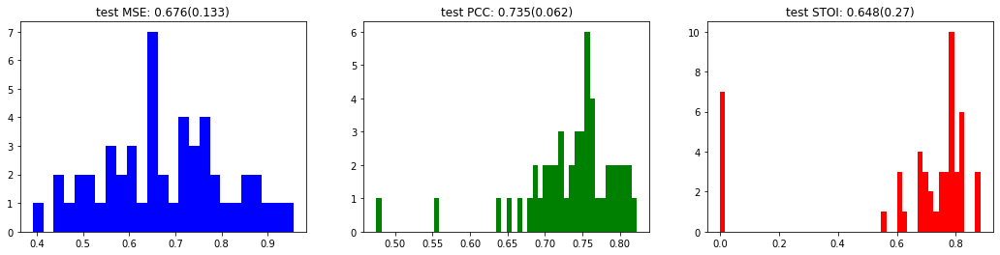

In [118]:
mse_test,pcc_test,stois_test = analyze(spec_pred,spec_gt,wave_pred,wave_gt)

# ECoG to audio result (5 words)

In [170]:
interval = 16384
wave_a2a = librosa.load('org.wav',sr=16000)[0]
sample_num = wave_a2a.shape[0]//interval*interval
wave_a2a=wave_a2a[:sample_num *interval]
wave_pred = librosa.load('ecog.wav',sr=16000)[0][:sample_num *interval]

select_word = np.loadtxt('wordlist.txt',dtype='str')
ecog_select_words = np.array(['house','sheep','watch','hat','envelope'])
sample_ind = array([22, 24, 26, 34,  44])#np.where(np.isin(select_word,ecog_select_words))[0]
wave_gt_select = np.concatenate(([wave_gt[i*interval:(i+1)*interval] for i in sample_ind]))
wave_merge = np.concatenate(([np.concatenate((wave_gt_select[i*interval:(i+1)*interval],wave_pred[i*interval:(i+1)*interval]))\
                 for i in range(5)]))

## gt audio

In [165]:
display(ipd.Audio(wave_gt_select,rate=16000))

## audio to audio recon

In [145]:
display(ipd.Audio(wave_a2a,rate=16000))

## ECoG to audio recon

In [146]:
display(ipd.Audio(wave_pred,rate=16000))

## corresponding word list

<details><summary><span style="color:red"><b>CLICK HERE to show/hide WORD LIST</b></span></summary>
<p>

<p>  1  <span style="color:blue"> <em>hammer    </em> </span> start from 0s </p>
<p>  2  <span style="color:blue"> <em>vase      </em> </span> start from 1.024s </p>
<p>  3  <span style="color:blue"> <em>umbrella  </em> </span> start from 2.048s </p>
<p>  4  <span style="color:blue"> <em>gun       </em> </span> start from 3.072s </p>
<p>  5  <span style="color:blue"> <em>key       </em> </span> start from 4.096s </p>

</p>
</details>

## merged audio

In [171]:
display(ipd.Audio(wave_merge,rate=16000))

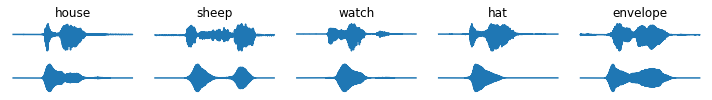

In [173]:
row_nums = 1
col_nums = 5
fig,ax=plt.subplots(row_nums*2,col_nums,figsize=(col_nums*2,row_nums*1.5))
for i in range(row_nums):
    for j in range(col_nums):
        try:
            ax[i*2,j].set_title(ecog_select_words[i*col_nums+j])
        except:
            pass
        ax[i*2,j].plot(wave_gt_select[(i*col_nums+j)*interval:(i*col_nums+j+1)*interval])
        ax[i*2+1,j].plot(wave_pred[(i*col_nums+j)*interval:(i*col_nums+j+1)*interval])
        ax[i*2,j].axis('off')
        ax[i*2+1,j].axis('off')
fig.tight_layout()

## spectrogram

In [175]:
spec_pred = np.zeros([5,256,128])
spec_gt = np.zeros([5,256,128])


for i in tqdm(range(5)):
    spec_pred[i] = plot_stft(wave_pred[i*interval:(i+1)*interval],n_fft=511,hop_length=129,ax=None ,y_axis='linear',n_mels=64)
    spec_gt[i] = plot_stft(wave_gt_select[i*interval:(i+1)*interval],n_fft=511,hop_length=129,ax=None,y_axis='linear',n_mels=64 )

spec_concat = np.concatenate(( np.flip(spec_gt,axis=1), np.flip(spec_pred,axis=1)),axis=1)
              #np.concatenate((np.swapaxes(spec_gt,2,1), np.swapaxes(spec_pred,2,1)),\
              #               axis=1)

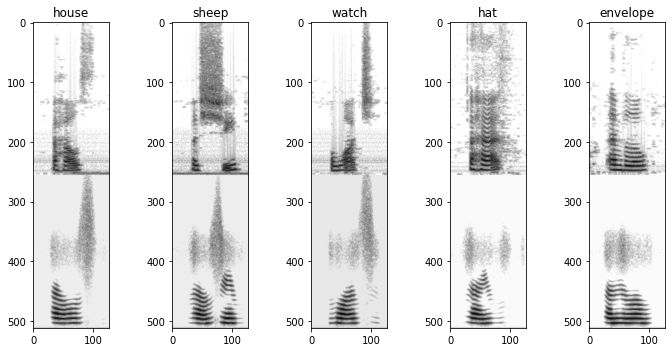

In [181]:
row_nums = 1
col_nums = 5
fig,ax=plt.subplots(row_nums,col_nums,figsize=(col_nums*2,row_nums*5))
cmap = cm.gray_r
for i in range(row_nums):
    for j in range(col_nums):
        try:
            ax[i,j].imshow(spec_concat[i*col_nums+j] ,cmap=cmap)
        except:
            ax[j].imshow(spec_concat[i*col_nums+j] ,cmap=cmap)
        try:
            ax[i,j].set_title(ecog_select_words[i*col_nums+j])
        except:
            pass
        try:
            ax[j].set_title(ecog_select_words[i*col_nums+j])
        except:
            pass
plt.tight_layout()

## metrics: MSE, PCC, STOI

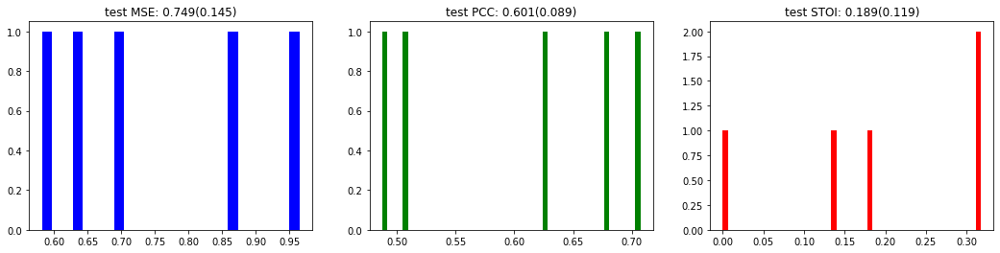

In [182]:
mse_test,pcc_test,stois_test = analyze(spec_pred,spec_gt,wave_pred,wave_gt)

```
jupyter nbconvert --execute /Users/james/Desktop/videolab/ECoG/report/2020/formant_summary/1023/result.ipynb --to html_toc --ExtractOutputPreprocessor.enabled=False
rm -rf /Users/james/Desktop/website/demo_web/blog/public/formant_summary
rsync -avzh  /Users/james/Desktop/videolab/ECoG/report/2020/formant_summary /Users/james/Desktop/website/demo_web/blog/public/
cd /Users/james/Desktop/website/demo_web/blog
hgd
```